In [1]:
import os
import pickle
import numpy as np
import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
import config
import tensorflow as tf
import gzip
from PIL import Image               
from IPython.display import display
from sklearn.linear_model import LogisticRegression, SGDClassifier, LinearRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.metrics import accuracy_score
from encoder.generator_model import Generator
import matplotlib.pylab as plt
%matplotlib inline

In [2]:
tflib.init_tf()
url = 'https://drive.google.com/uc?id=1MEGjdvVpUsu1jB4zrXZN7Y4kBBOzizDQ' # karras2019stylegan-ffhq-1024x1024.pkl
with dnnlib.util.open_url(url, cache_dir=config.cache_dir) as f:
    _G, _D, Gs = pickle.load(f)

Instructions for updating:
Colocations handled automatically by placer.


In [3]:
# constants 
experiment_folder = './experiments/'
w = h = 1024
margin = 20
fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)

def generate_image(latent):  
    if latent_type == 'qlatent': # qlatent: (None, 512)
        return Gs.run(latent, input_transform=None, randomize_noise=False, output_transform=fmt)
    elif latent_type == 'dlatent': # dlatent: (None, 512)
        return Gs.components.synthesis.run(np.repeat(np.expand_dims(latent, axis=1), 18, axis=1), input_transform=None, randomize_noise=False, output_transform=fmt)
    elif latent_type == 'dlatent18': # dlatent18: (None, 18, 512)
        return Gs.components.synthesis.run(latent, input_transform=None, randomize_noise=False, output_transform=fmt)
    else:
        assert 0
    

In [4]:
# load latents

# latent_folder = 'L2_z_latent/'
# latent_type = 'qlatent'

# latent_folder = 'perceptual_w_512_latent/'
# latent_type = 'dlatent'

latent_folder = 'perceptual_w_latent/'
latent_type = 'dlatent18'

latent_path = experiment_folder + latent_folder

# filenames = sorted(os.listdir(latent_path))
filenames = ['asian_man_01.npy',
             'white_woman_01.npy',
             'black_man_01.npy',
             'asian_woman_01.npy',
             'white_man_01.npy',
             'black_woman_01.npy']
# filenames = ['asian_woman_01.npy',
#              'asian_man_01.npy',
#              'white_woman_01.npy',
#              'black_woman_01.npy',
#              'black_man_01.npy',
#              'white_man_01.npy']
latents = []
for f in filenames:
    latents.append(np.expand_dims(np.load(latent_path + f), axis=0))

In [ ]:
# show images 
images_np = generate_image(np.vstack(latents))   
images = [Image.fromarray(x) for x in images_np]
# display(*images)

In [ ]:
# 1. interpolation 
num_interval = 3 
interpolation_folder = experiment_folder + 'interpolation/'

latents_interp = []
for i in range(len(latents) - 1):
    latents_interp += [(1 - x) * latents[i] + x * latents[i + 1] for x in np.linspace(0, 1, num_interval + 2)]

images_interp_np = generate_image(np.vstack(latents_interp))

In [ ]:
for i in range(len(images_interp_np)):
    Image.fromarray(images_interp_np[i]).save(interpolation_folder + '{}.png'.format(i))

canvas = Image.new('RGB', ((num_interval + 2) * (w + margin), (len(latents) - 1) * (h + margin)), 'white')
for row in range(len(latents) - 1):
    for col in range(num_interval + 2):
        canvas.paste(Image.fromarray(images_interp_np[row * (num_interval + 2) + col]), (col * (w + margin), row * (h + margin)))
canvas.save(interpolation_folder + 'interpolation.png')

In [ ]:
# 1.1. all possible interpolation 
num_interval = 3 
interpolation_folder = experiment_folder + 'interpolation_w_18/'

latents_interp = []
images_interp_np = []
for i in range(len(latents)):
    for j in range(len(latents)):
        if i != j:
            images_interp_np += [generate_image((1 - x) * latents[i] + x * latents[j])[0] for x in np.linspace(0, 1, num_interval + 2)]
            

In [ ]:
for i in range(len(images_interp_np)):
    Image.fromarray(images_interp_np[i]).save(interpolation_folder + '{}.png'.format(i))

canvas = Image.new('RGB', ((num_interval + 2) * (w + margin), (len(latents) - 1) * len(latents) * (h + margin)), 'white')
for row in range((len(latents) - 1) * len(latents)) :
    for col in range(num_interval + 2):
        canvas.paste(Image.fromarray(images_interp_np[row * (num_interval + 2) + col]), (col * (w + margin), row * (h + margin)))
canvas.save(interpolation_folder + 'interpolation.png')

In [ ]:
# 2. style mixing
style_ranges = [range(0, 4), range(4, 8), range(8, 18)]
style_mixing_folder = experiment_folder + 'style_mixing/'

for dst in range(len(latents)):
    for src in range(len(latents)):
        for i in range(len(style_ranges)):
            mixed_latent = np.copy(latents[dst])
            mixed_latent[:, style_ranges[i]] = latents[src][:, style_ranges[i]]
            mixed_image = generate_image(mixed_latent)  
            Image.fromarray(mixed_image[0]).save(style_mixing_folder + '{}_{}_{}.png'.format(dst, src, i))

In [ ]:
# 3. background hallucination
background_hallucination_folder = experiment_folder + 'background_hallucination/'
for i in range(len(latents)):
    sin_latent = np.tanh(latents[i])
    sin_image = generate_image(sin_latent)
    Image.fromarray(sin_image[0]).save(background_hallucination_folder + '{}.png'.format(i))
    
# failed

In [ ]:
# 4. mean z???
mean_folder = experiment_folder + 'mean/'
for i in range(len(latents)):
    mean_latent = np.repeat(np.mean(latents[i], axis=1, keepdims=True), 18, axis=1)
    mean_image = generate_image(mean_latent) 
    Image.fromarray(mean_image[0]).save(mean_folder + '{}.png'.format(i))
    
# failed

In [ ]:
# 5. zoom
zoom_folder = experiment_folder + 'zoom/'
for i in range(len(latents)):
    for factor in np.linspace(0, 2, 6):
        zoom_latent = latents[i] / np.abs(latents[i]) * factor
        zoom_image = generate_image(zoom_latent) 
        Image.fromarray(zoom_image[0]).save(zoom_folder + '{}_{}.png'.format(i, factor))
        
# failed

In [ ]:
# 6. direction

# Microsoft Cognitive Services API for labeling of generated images
# https://azure.microsoft.com/en-us/services/cognitive-services/face/

LATENT_TRAINING_DATA = 'https://drive.google.com/uc?id=1xMM3AFq0r014IIhBLiMCjKJJvbhLUQ9t'
    
with dnnlib.util.open_url(LATENT_TRAINING_DATA, cache_dir=config.cache_dir) as f:
    qlatent_data, dlatent_data, labels_data = pickle.load(gzip.GzipFile(fileobj=f))

In [ ]:
print(qlatent_data.shape)
print(dlatent_data.shape)
labels_data[0]

In [ ]:
features = [
    (('faceAttributes', 'age'), lambda x: x > 35),
    (('faceAttributes', 'gender'), lambda x: x == 'male'),
    (('faceRectangle', 'width'), lambda x: x > 575),
    (('faceAttributes', 'smile'), lambda x: x > 0.5),
    (('faceAttributes', 'headPose', 'yaw'), lambda x: x > 0),
    (('faceAttributes', 'glasses'), lambda x: x == 'NoGlasses'),
]

In [ ]:
# hist
value = {}
for name, threshold in features:
    value[name] = []
    for d in labels_data:
        for n in name:
            d = d[n]
        value[name].append(d)
    
for name, threshold in features:  
    plt.hist(value[name], bins=30, color='blue', label='.'.join(name))
    plt.legend()
    plt.show()

In [ ]:
# extract binary data
X_data = dlatent_data.reshape((-1, 18*512))
y_data = {}
for name, threshold in features:
    y_data[name] = [threshold(v) for v in value[name]]

In [ ]:
# extract feature direction
clf = {}
direction = {}
for name, threshold in features: 
    print(name)
    clf[name] = LogisticRegression(class_weight='balanced').fit(X_data, y_data[name])
    direction[name] = clf[name].coef_.reshape((18, 512))

In [ ]:
for name, threshold in features:
    np.save('experiments/direction/{}.npy'.format('_'.join(name)), direction[name])

In [5]:
direction = []
direction_name = []
for f in os.listdir('experiments/direction/'):
    d = np.load('experiments/direction/' + f)
    direction.append(d)
    direction_name.append(f)

In [11]:
def move_and_show(latent_vector, direction, coeffs, name):
    fig,ax = plt.subplots(1, len(coeffs), figsize=(15, 10), dpi=200)
    for i, coeff in enumerate(coeffs):
        new_latent_vector = latent_vector.copy()
        new_latent_vector[:8] = (latent_vector + coeff*direction)[:8]
        img = generate_image(np.expand_dims(new_latent_vector, axis=0))[0]
        Image.fromarray(img).save('experiments/direction_images/' + '{}_{}.png'.format(name, coeff))
        ax[i].imshow(img)
        ax[i].set_title('Coeff: %0.1f' % coeff)
    [x.axis('off') for x in ax]
    plt.show()

In [ ]:
for name, threshold in features:
    print(name)
    for i in range(5):
        move_and_show(X_data.reshape((-1, 18, 512))[i], direction[name], [-5, -1.5, 0, 1.5, 5])



In [ ]:
for name, threshold in features:
    print(name)
    for latent in latents:
        move_and_show(latent[0], direction[name], [-2, -1, 0, 1, 2], name)

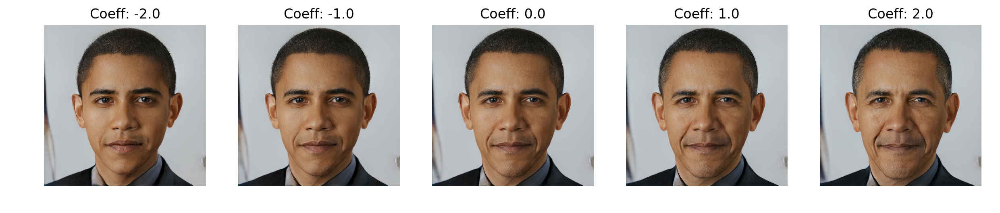

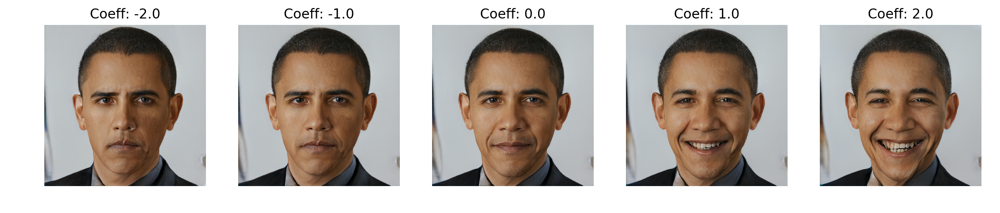

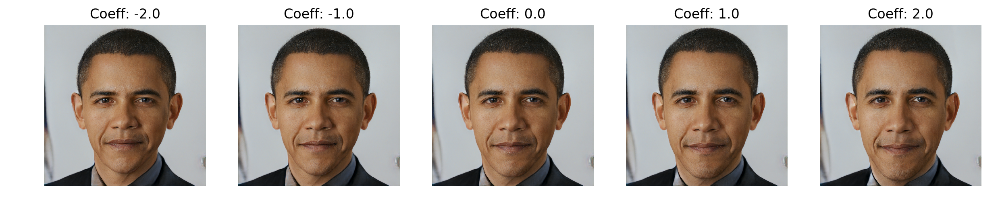

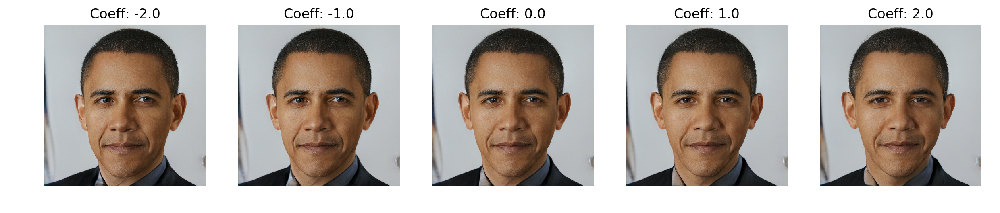

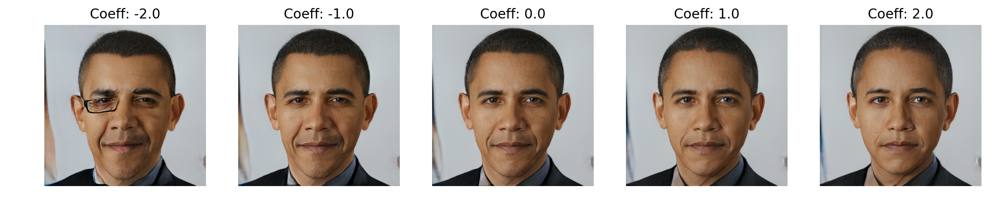

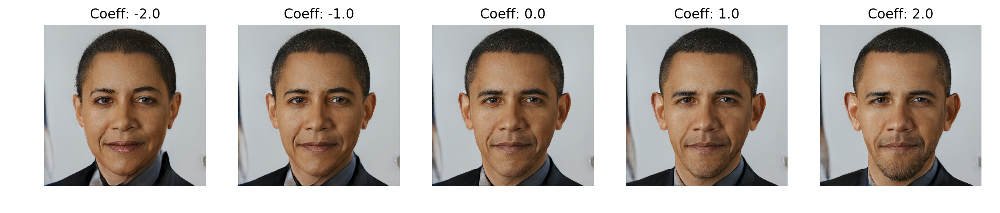

In [12]:
for i in range(len(direction)):
    move_and_show(latents[2][0], direction[i], [-2, -1, 0, 1, 2], direction_name[i])